In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn.preprocessing

import os

import librosa
import librosa.display
import IPython

import essentia
import essentia.standard as es
from essentia.standard import *

# Data preprocessing

Load the annotations dataset (song level) for song id 1 to 2000

In [ ]:
df_annotations_1 = pd.read_csv('data/annotations/annotations averaged per song/song_level/static_annotations_averaged_songs_1_2000.csv')
display(df_annotations_1.head())
print(df_annotations_1.shape)

,song_id,valence_mean,valence_std,arousal_mean,arousal_std
0,2,3.1,0.94,3.0,0.63
1,3,3.5,1.75,3.3,1.62
2,4,5.7,1.42,5.5,1.63
3,5,4.4,2.01,5.3,1.85
4,7,5.8,1.47,6.4,1.69


(1744, 5)


Load the annotations dataset (song level) for song id 2001 to 2058

In [ ]:
df_annotations_2 = pd.read_csv('data/annotations/annotations averaged per song/song_level/static_annotations_averaged_songs_2000_2058.csv')
display(df_annotations_2.head())
print(df_annotations_1.shape)

,song_id,valence_mean,valence_std,valence_ max_mean,valence_max_std,valence_min_mean,valence_min_std,arousal_mean,arousal_std,arousal_max_mean,arousal_max_std,arousal_min_mean,arousal_min_std
0,2001,3.2,0.98,5.0,1.41,2.2,0.98,6.6,0.80,8.6,0.49,3.4,1.02
1,2002,6.4,0.49,8.2,0.98,5.0,1.10,5.2,1.17,7.4,1.36,2.2,1.17
2,2003,5.4,1.50,7.2,1.17,3.4,1.02,4.6,1.85,6.2,2.04,1.4,0.49
3,2004,5.0,1.10,6.4,1.02,3.2,1.17,4.8,1.60,6.0,2.28,2.8,0.98
4,2005,3.8,1.17,5.0,1.10,1.6,0.80,5.2,0.75,8.4,0.80,2.0,1.10


(1744, 5)


Select the same columns from df_annotations_2 as those in df_annotations_1, since the annotations for song_ids 2001 to 2058 onwards have more columns not found in the annotations for song_ids 1 to 2000

In [ ]:
df_annotations_2 = df_annotations_2[df_annotations_1.columns.to_list()]
display(df_annotations_2.tail())
print(df_annotations_2.shape)

,song_id,valence_mean,valence_std,arousal_mean,arousal_std
53,2054,5.40,1.20,3.60,1.36
54,2055,5.00,1.41,5.20,1.47
55,2056,5.00,1.41,4.60,1.74
56,2057,3.17,1.07,6.83,0.37
57,2058,3.80,0.75,5.80,1.17


(58, 5)


Merge the 2 annotation datasets together

In [ ]:
df_annotations = pd.concat([df_annotations_1, df_annotations_2], ignore_index=True, sort=False)
df_annotations

,song_id,valence_mean,valence_std,arousal_mean,arousal_std
0,2,3.10,0.94,3.00,0.63
1,3,3.50,1.75,3.30,1.62
2,4,5.70,1.42,5.50,1.63
3,5,4.40,2.01,5.30,1.85
4,7,5.80,1.47,6.40,1.69
...,...,...,...,...,...
1797,2054,5.40,1.20,3.60,1.36
1798,2055,5.00,1.41,5.20,1.47
1799,2056,5.00,1.41,4.60,1.74
1800,2057,3.17,1.07,6.83,0.37


Study how each of the feature .csv file is structured, use data/features/2.csv as reference

In [ ]:
df_features_2 = pd.read_csv('data/features/2.csv', sep=";")
df_features_2

,frameTime,F0final_sma_stddev,F0final_sma_amean,voicingFinalUnclipped_sma_stddev,voicingFinalUnclipped_sma_amean,jitterLocal_sma_stddev,jitterLocal_sma_amean,jitterDDP_sma_stddev,jitterDDP_sma_amean,shimmerLocal_sma_stddev,...,pcm_fftMag_mfcc_sma_de[10]_stddev,pcm_fftMag_mfcc_sma_de[10]_amean,pcm_fftMag_mfcc_sma_de[11]_stddev,pcm_fftMag_mfcc_sma_de[11]_amean,pcm_fftMag_mfcc_sma_de[12]_stddev,pcm_fftMag_mfcc_sma_de[12]_amean,pcm_fftMag_mfcc_sma_de[13]_stddev,pcm_fftMag_mfcc_sma_de[13]_amean,pcm_fftMag_mfcc_sma_de[14]_stddev,pcm_fftMag_mfcc_sma_de[14]_amean
0,0.0,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.575783,0.088504,2.002094,-0.124019,1.622895,-0.072487,1.576064,0.050096,1.445897,0.050918
1,0.5,46.61850,41.97005,0.378904,0.356571,0.085623,0.061258,0.047632,0.033217,0.238251,...,2.244503,0.032127,1.956086,0.153728,1.717359,-0.057745,1.736595,0.118837,1.416120,-0.043104
2,1.0,26.41163,83.31398,0.132493,0.744620,0.095971,0.107569,0.074092,0.085019,0.194595,...,2.561800,-0.267761,2.263875,-0.114941,1.858172,-0.059376,1.898971,-0.123918,1.393922,-0.123629
3,1.5,20.73190,94.65977,0.020989,0.793159,0.087955,0.067104,0.080334,0.069403,0.124708,...,2.258977,0.027287,2.334805,-0.062530,1.719393,-0.030040,1.609432,-0.182741,1.447644,-0.044436
4,2.0,11.78187,104.48090,0.017434,0.804634,0.088844,0.062528,0.125778,0.058190,0.085753,...,1.711694,0.317357,1.693854,0.174610,1.252481,0.092174,1.249982,0.071656,1.310757,0.060816
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444,222.0,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.262343,-0.208193,2.637073,-0.218757,1.942853,-0.091093,1.348907,0.054206,1.858799,-0.013873
445,222.5,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.191734,0.057542,2.497067,-0.023218,1.780268,0.115411,1.518618,0.105126,2.169850,-0.052166
446,223.0,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.158662,0.034466,2.149979,0.203180,1.791381,0.183530,1.522255,-0.056712,1.865502,-0.097116
447,223.5,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.841555,-0.105667,1.736049,0.143069,2.048988,0.094187,1.543160,0.013000,1.501096,-0.017900


Since the df_annotations is for song level, where the annotations are averaged for the whole song, instead of per time frame, we average out each of the features for the whole song too 

In [ ]:
df_features_2 = pd.DataFrame(df_features_2.mean(axis=0, skipna=True)).transpose().drop('frameTime', axis=1)
df_features_2

,F0final_sma_stddev,F0final_sma_amean,voicingFinalUnclipped_sma_stddev,voicingFinalUnclipped_sma_amean,jitterLocal_sma_stddev,jitterLocal_sma_amean,jitterDDP_sma_stddev,jitterDDP_sma_amean,shimmerLocal_sma_stddev,shimmerLocal_sma_amean,...,pcm_fftMag_mfcc_sma_de[10]_stddev,pcm_fftMag_mfcc_sma_de[10]_amean,pcm_fftMag_mfcc_sma_de[11]_stddev,pcm_fftMag_mfcc_sma_de[11]_amean,pcm_fftMag_mfcc_sma_de[12]_stddev,pcm_fftMag_mfcc_sma_de[12]_amean,pcm_fftMag_mfcc_sma_de[13]_stddev,pcm_fftMag_mfcc_sma_de[13]_amean,pcm_fftMag_mfcc_sma_de[14]_stddev,pcm_fftMag_mfcc_sma_de[14]_amean
0,19.860414,93.884056,0.027706,0.742852,0.117239,0.099609,0.112936,0.095736,0.11805,0.180007,...,2.180024,0.000537,2.230241,0.00028,1.982235,0.000254,1.91853,0.000173,1.694786,-0.000031


Do the same for every .csv file in data/features for each of the 1802 songs, and put them altogether in a dataframe df_features

In [ ]:
directory = os.fsencode('./data/features')
song_ids = []

for file in os.listdir(directory):
  file_name = os.fsdecode(file)
  song_id = int(file_name[:-4])
  song_ids.append(song_id)

song_ids.sort()
df_features = pd.DataFrame(columns=df_features_2.columns)

for song_id in song_ids:
  df_features_temp = pd.read_csv(f'data/features/{song_id}.csv', sep=";")
  df_features_temp = pd.DataFrame(df_features_temp.mean(axis=0, skipna=True)).transpose().drop('frameTime', axis=1)
  df_features = pd.concat([df_features, df_features_temp])

df_features.insert(0, column='song_id', value=song_ids)
df_features

/var/folders/ft/gzvmkgdj727g157scc1xw9f80000gn/T/ipykernel_46788/1799164160.py:15: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_features = pd.concat([df_features, df_features_temp])


,song_id,F0final_sma_stddev,F0final_sma_amean,voicingFinalUnclipped_sma_stddev,voicingFinalUnclipped_sma_amean,jitterLocal_sma_stddev,jitterLocal_sma_amean,jitterDDP_sma_stddev,jitterDDP_sma_amean,shimmerLocal_sma_stddev,...,pcm_fftMag_mfcc_sma_de[10]_stddev,pcm_fftMag_mfcc_sma_de[10]_amean,pcm_fftMag_mfcc_sma_de[11]_stddev,pcm_fftMag_mfcc_sma_de[11]_amean,pcm_fftMag_mfcc_sma_de[12]_stddev,pcm_fftMag_mfcc_sma_de[12]_amean,pcm_fftMag_mfcc_sma_de[13]_stddev,pcm_fftMag_mfcc_sma_de[13]_amean,pcm_fftMag_mfcc_sma_de[14]_stddev,pcm_fftMag_mfcc_sma_de[14]_amean
0,2,19.860414,93.884056,0.027706,0.742852,0.117239,0.099609,0.112936,0.095736,0.118050,...,2.180024,5.369898e-04,2.230241,2.795768e-04,1.982235,2.542186e-04,1.918530,1.726519e-04,1.694786,-3.051494e-05
0,3,19.000312,62.682589,0.031728,0.754430,0.083326,0.056241,0.076878,0.054784,0.133759,...,1.684190,2.858169e-04,1.792956,2.030164e-04,1.709216,5.744590e-05,1.519361,-5.567165e-05,1.391123,-8.473427e-06
0,4,48.175781,92.850316,0.042853,0.753095,0.136936,0.081527,0.153833,0.095950,0.136401,...,2.133195,1.650659e-05,2.083527,4.228550e-04,2.022455,2.467478e-04,1.852797,3.383194e-05,1.590440,2.433487e-05
0,5,61.043677,158.673853,0.032721,0.757328,0.117823,0.101659,0.135685,0.108718,0.101054,...,2.171685,-2.482530e-09,2.125705,-1.203645e-09,1.899873,-7.903614e-10,1.758863,2.250000e-09,1.553451,-7.647590e-10
0,7,14.317295,83.823484,0.036337,0.787512,0.098302,0.059757,0.096449,0.060557,0.169927,...,1.899126,-7.397941e-04,1.652931,-5.146167e-04,1.616115,-3.012753e-04,1.455275,5.290876e-04,1.382201,2.044570e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,2054,60.439987,135.227449,0.033471,0.794851,0.112610,0.074239,0.133267,0.083880,0.117681,...,1.807169,1.354159e-03,1.848548,2.334927e-03,1.769273,1.942244e-03,1.523673,3.964342e-04,1.475354,-4.890418e-04
0,2055,99.440455,132.265650,0.059393,0.757890,0.105004,0.066159,0.111205,0.071426,0.117365,...,2.525791,-2.726037e-04,2.408328,4.060140e-04,2.307614,6.132043e-04,2.076692,7.187288e-04,1.909902,4.615625e-04
0,2056,53.946587,109.565479,0.061583,0.758426,0.097751,0.068848,0.100636,0.069814,0.139728,...,2.457865,5.606182e-04,2.241761,-4.000093e-04,2.108922,-1.759559e-04,1.997892,3.087410e-04,1.819372,4.370266e-04
0,2057,57.305704,97.481459,0.040370,0.738427,0.119818,0.073172,0.123405,0.079882,0.113077,...,2.188678,4.668206e-04,2.280854,-4.331298e-05,1.972264,-4.708263e-04,1.773326,4.271507e-04,1.578647,-1.839370e-05


A list of all features

In [ ]:
df_features.columns.tolist()

['song_id',
 'F0final_sma_stddev',
 'F0final_sma_amean',
 'voicingFinalUnclipped_sma_stddev',
 'voicingFinalUnclipped_sma_amean',
 'jitterLocal_sma_stddev',
 'jitterLocal_sma_amean',
 'jitterDDP_sma_stddev',
 'jitterDDP_sma_amean',
 'shimmerLocal_sma_stddev',
 'shimmerLocal_sma_amean',
 'logHNR_sma_stddev',
 'logHNR_sma_amean',
 'audspec_lengthL1norm_sma_stddev',
 'audspec_lengthL1norm_sma_amean',
 'audspecRasta_lengthL1norm_sma_stddev',
 'audspecRasta_lengthL1norm_sma_amean',
 'pcm_RMSenergy_sma_stddev',
 'pcm_RMSenergy_sma_amean',
 'pcm_zcr_sma_stddev',
 'pcm_zcr_sma_amean',
 'audSpec_Rfilt_sma[0]_stddev',
 'audSpec_Rfilt_sma[0]_amean',
 'audSpec_Rfilt_sma[1]_stddev',
 'audSpec_Rfilt_sma[1]_amean',
 'audSpec_Rfilt_sma[2]_stddev',
 'audSpec_Rfilt_sma[2]_amean',
 'audSpec_Rfilt_sma[3]_stddev',
 'audSpec_Rfilt_sma[3]_amean',
 'audSpec_Rfilt_sma[4]_stddev',
 'audSpec_Rfilt_sma[4]_amean',
 'audSpec_Rfilt_sma[5]_stddev',
 'audSpec_Rfilt_sma[5]_amean',
 'audSpec_Rfilt_sma[6]_stddev',
 'audS

In [ ]:
df = pd.merge(df_features, df_annotations, on='song_id', how='inner')
df

,song_id,F0final_sma_stddev,F0final_sma_amean,voicingFinalUnclipped_sma_stddev,voicingFinalUnclipped_sma_amean,jitterLocal_sma_stddev,jitterLocal_sma_amean,jitterDDP_sma_stddev,jitterDDP_sma_amean,shimmerLocal_sma_stddev,...,pcm_fftMag_mfcc_sma_de[12]_stddev,pcm_fftMag_mfcc_sma_de[12]_amean,pcm_fftMag_mfcc_sma_de[13]_stddev,pcm_fftMag_mfcc_sma_de[13]_amean,pcm_fftMag_mfcc_sma_de[14]_stddev,pcm_fftMag_mfcc_sma_de[14]_amean,valence_mean,valence_std,arousal_mean,arousal_std
0,2,19.860414,93.884056,0.027706,0.742852,0.117239,0.099609,0.112936,0.095736,0.118050,...,1.982235,2.542186e-04,1.918530,1.726519e-04,1.694786,-3.051494e-05,3.10,0.94,3.00,0.63
1,3,19.000312,62.682589,0.031728,0.754430,0.083326,0.056241,0.076878,0.054784,0.133759,...,1.709216,5.744590e-05,1.519361,-5.567165e-05,1.391123,-8.473427e-06,3.50,1.75,3.30,1.62
2,4,48.175781,92.850316,0.042853,0.753095,0.136936,0.081527,0.153833,0.095950,0.136401,...,2.022455,2.467478e-04,1.852797,3.383194e-05,1.590440,2.433487e-05,5.70,1.42,5.50,1.63
3,5,61.043677,158.673853,0.032721,0.757328,0.117823,0.101659,0.135685,0.108718,0.101054,...,1.899873,-7.903614e-10,1.758863,2.250000e-09,1.553451,-7.647590e-10,4.40,2.01,5.30,1.85
4,7,14.317295,83.823484,0.036337,0.787512,0.098302,0.059757,0.096449,0.060557,0.169927,...,1.616115,-3.012753e-04,1.455275,5.290876e-04,1.382201,2.044570e-04,5.80,1.47,6.40,1.69
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1797,2054,60.439987,135.227449,0.033471,0.794851,0.112610,0.074239,0.133267,0.083880,0.117681,...,1.769273,1.942244e-03,1.523673,3.964342e-04,1.475354,-4.890418e-04,5.40,1.20,3.60,1.36
1798,2055,99.440455,132.265650,0.059393,0.757890,0.105004,0.066159,0.111205,0.071426,0.117365,...,2.307614,6.132043e-04,2.076692,7.187288e-04,1.909902,4.615625e-04,5.00,1.41,5.20,1.47
1799,2056,53.946587,109.565479,0.061583,0.758426,0.097751,0.068848,0.100636,0.069814,0.139728,...,2.108922,-1.759559e-04,1.997892,3.087410e-04,1.819372,4.370266e-04,5.00,1.41,4.60,1.74
1800,2057,57.305704,97.481459,0.040370,0.738427,0.119818,0.073172,0.123405,0.079882,0.113077,...,1.972264,-4.708263e-04,1.773326,4.271507e-04,1.578647,-1.839370e-05,3.17,1.07,6.83,0.37


# Univariate Analysis

Text(0, 0.5, 'count')

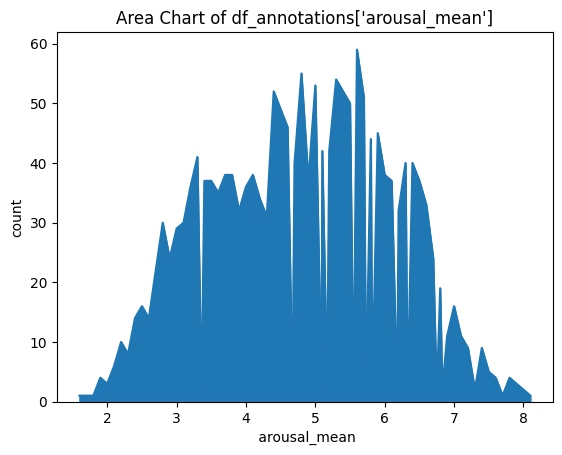

In [ ]:
plot = df_annotations[' arousal_mean'].value_counts().sort_index().plot.area()
plot.set_title("Area Chart of df_annotations['arousal_mean']")
plot.set_ylabel('count')

Text(0, 0.5, 'count')

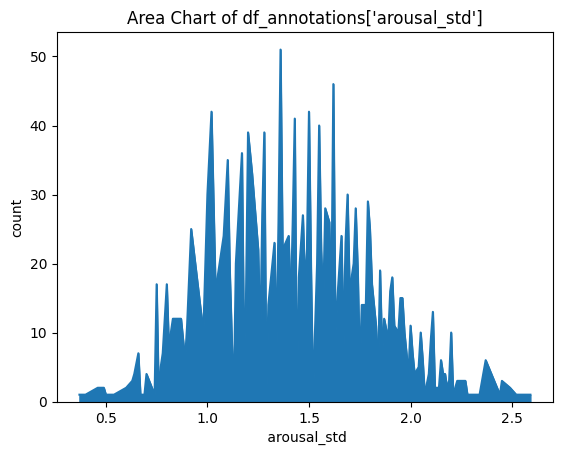

In [ ]:
plot = df_annotations[' arousal_std'].value_counts().sort_index().plot.area()
plot.set_title("Area Chart of df_annotations['arousal_std']")
plot.set_ylabel('count')

Text(0, 0.5, 'count')

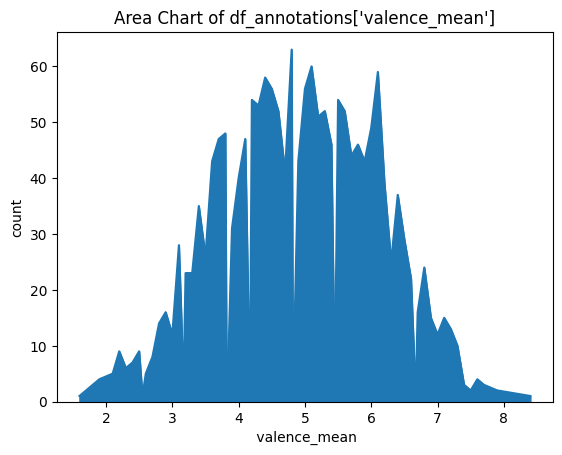

In [ ]:
plot = df_annotations[' valence_mean'].value_counts().sort_index().plot.area()
plot.set_title("Area Chart of df_annotations['valence_mean']")
plot.set_ylabel('count')

Text(0, 0.5, 'count')

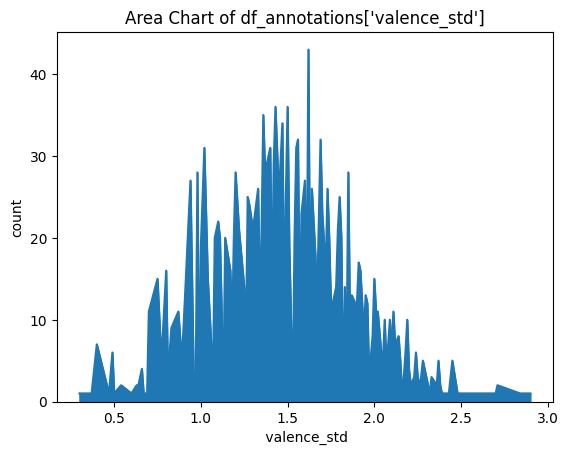

In [ ]:
plot = df_annotations[' valence_std'].value_counts().sort_index().plot.area()
plot.set_title("Area Chart of df_annotations['valence_std']")
plot.set_ylabel('count')

# Bivariate Analysis

Text(0.5, 1.0, 'Scatterplot of valence_mean vs arousal_mean')

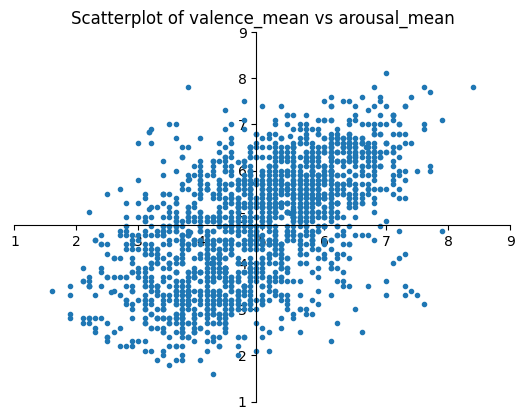

In [ ]:
plt.plot(df[' valence_mean'], df[' arousal_mean'], '.')
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.gca().spines["left"].set_position(("data", df_annotations[" valence_mean"].mean()))
plt.gca().spines["bottom"].set_position(("data", df_annotations[" arousal_mean"].mean()))

# since the values in the annotations range from 1 to 9
plt.gca().set_xlim([1, 9])
plt.gca().set_ylim([1, 9])
plt.title('Scatterplot of valence_mean vs arousal_mean')

# Using Essentia to extract features from music

Load the .mp3 file

In [ ]:
# Load the mp3 file
audio_file = 'data/MEMD_audio/2.mp3'

IPython.display.Audio(audio_file)

Extract the features from one .mp3 file and see what is being outputted

In [ ]:
# Compute all features, aggregate only 'mean' and 'stdev' statistics for all low-level, rhythm and tonal frame features
features, features_frames = es.MusicExtractor(lowlevelStats=['mean', 'stdev'],
                                              rhythmStats=['mean', 'stdev'],
                                              tonalStats=['mean', 'stdev'])(audio_file)

print("Filename:", features['metadata.tags.file_name'])
print("-"*80)
print("Replay gain:", features['metadata.audio_properties.replay_gain'])
print("EBU128 integrated loudness:", features['lowlevel.loudness_ebu128.integrated'])
print("EBU128 loudness range:", features['lowlevel.loudness_ebu128.loudness_range'])
print("-"*80)
print("MFCC mean:", features['lowlevel.mfcc.mean'])
print("-"*80)
print("BPM:", features['rhythm.bpm'])
print("Beat positions (sec.)", features['rhythm.beats_position'])
print("-"*80)
print("Key/scale estimation (using a profile specifically suited for electronic music):",
      features['tonal.key_edma.key'], features['tonal.key_edma.scale'])

Filename: 2.mp3
--------------------------------------------------------------------------------
Replay gain: -5.901832580566406
EBU128 integrated loudness: -24.06508445739746
EBU128 loudness range: 2.131702423095703
--------------------------------------------------------------------------------
MFCC mean: [-7.1440125e+02  1.4737717e+02 -2.9334414e+00  2.5783234e+01
  5.7739158e+00  5.9342022e+00  9.4089470e+00 -3.4126572e-02
 -3.0795817e+00  3.4712417e+00 -8.0566305e-01 -3.1203265e+00
  5.9542160e+00]
--------------------------------------------------------------------------------
BPM: 93.66617584228516
Beat positions (sec.) [ 0.6501587  1.3003174  1.9504762  2.577415   3.2159636  3.8545125
  4.504671   5.14322    5.781769   6.431927   7.070476   7.709025
  8.347573   8.974512   9.613061  10.24      10.866939  11.493877
 12.144036  12.782585  13.421134  14.071292  14.709841  15.34839
 15.986938  16.625486  17.252426  17.879364  18.517914  19.156462
 19.795012  20.43356   21.10694   2

[   INFO   ] MusicExtractor: Read metadata
[   INFO   ] MusicExtractor: Compute md5 audio hash, codec, length, and EBU 128 loudness
[   INFO   ] MusicExtractor: Replay gain
[   INFO   ] MusicExtractor: Compute audio features
[   INFO   ] MusicExtractor: Compute aggregation
[   INFO   ] All done


In [ ]:
print(features.descriptorNames())


['lowlevel.average_loudness', 'lowlevel.barkbands_crest.mean', 'lowlevel.barkbands_crest.stdev', 'lowlevel.barkbands_flatness_db.mean', 'lowlevel.barkbands_flatness_db.stdev', 'lowlevel.barkbands_kurtosis.mean', 'lowlevel.barkbands_kurtosis.stdev', 'lowlevel.barkbands_skewness.mean', 'lowlevel.barkbands_skewness.stdev', 'lowlevel.barkbands_spread.mean', 'lowlevel.barkbands_spread.stdev', 'lowlevel.dissonance.mean', 'lowlevel.dissonance.stdev', 'lowlevel.dynamic_complexity', 'lowlevel.erbbands_crest.mean', 'lowlevel.erbbands_crest.stdev', 'lowlevel.erbbands_flatness_db.mean', 'lowlevel.erbbands_flatness_db.stdev', 'lowlevel.erbbands_kurtosis.mean', 'lowlevel.erbbands_kurtosis.stdev', 'lowlevel.erbbands_skewness.mean', 'lowlevel.erbbands_skewness.stdev', 'lowlevel.erbbands_spread.mean', 'lowlevel.erbbands_spread.stdev', 'lowlevel.hfc.mean', 'lowlevel.hfc.stdev', 'lowlevel.loudness_ebu128.integrated', 'lowlevel.loudness_ebu128.loudness_range', 'lowlevel.loudness_ebu128.momentary.mean', 'l

In [ ]:
essentia_features_columns = []
essentia_features_values = []

for feature in features.descriptorNames():
  data = features[feature]
  
  if ((type(data) is float) or (type(data) is str)):
    essentia_features_columns.append(feature)
    essentia_features_values.append(data)

for column_name in essentia_features_columns:
  print(column_name)

df_essentia = pd.DataFrame([essentia_features_values], columns=essentia_features_columns)
df_essentia

lowlevel.average_loudness
lowlevel.barkbands_crest.mean
lowlevel.barkbands_crest.stdev
lowlevel.barkbands_flatness_db.mean
lowlevel.barkbands_flatness_db.stdev
lowlevel.barkbands_kurtosis.mean
lowlevel.barkbands_kurtosis.stdev
lowlevel.barkbands_skewness.mean
lowlevel.barkbands_skewness.stdev
lowlevel.barkbands_spread.mean
lowlevel.barkbands_spread.stdev
lowlevel.dissonance.mean
lowlevel.dissonance.stdev
lowlevel.dynamic_complexity
lowlevel.erbbands_crest.mean
lowlevel.erbbands_crest.stdev
lowlevel.erbbands_flatness_db.mean
lowlevel.erbbands_flatness_db.stdev
lowlevel.erbbands_kurtosis.mean
lowlevel.erbbands_kurtosis.stdev
lowlevel.erbbands_skewness.mean
lowlevel.erbbands_skewness.stdev
lowlevel.erbbands_spread.mean
lowlevel.erbbands_spread.stdev
lowlevel.hfc.mean
lowlevel.hfc.stdev
lowlevel.loudness_ebu128.integrated
lowlevel.loudness_ebu128.loudness_range
lowlevel.loudness_ebu128.momentary.mean
lowlevel.loudness_ebu128.momentary.stdev
lowlevel.loudness_ebu128.short_term.mean
lowlevel

,lowlevel.average_loudness,lowlevel.barkbands_crest.mean,lowlevel.barkbands_crest.stdev,lowlevel.barkbands_flatness_db.mean,lowlevel.barkbands_flatness_db.stdev,lowlevel.barkbands_kurtosis.mean,lowlevel.barkbands_kurtosis.stdev,lowlevel.barkbands_skewness.mean,lowlevel.barkbands_skewness.stdev,lowlevel.barkbands_spread.mean,...,metadata.version.essentia_git_sha,metadata.version.extractor,tonal.chords_key,tonal.chords_scale,tonal.key_edma.key,tonal.key_edma.scale,tonal.key_krumhansl.key,tonal.key_krumhansl.scale,tonal.key_temperley.key,tonal.key_temperley.scale
0,0.972293,11.533354,3.735808,0.168912,0.041526,7.181094,14.769882,2.009696,1.462097,16.65633,...,v2.1_beta5-1110-g77a6a954-dirty,music 2.0,A,major,D,minor,D,minor,D,minor


In [ ]:
selected_features = ['rhythm.bpm',
                     'lowlevel.average_loudness',
                     'rhythm.beats_count',
                     'rhythm.beats_loudness.mean',
                     'rhythm.beats_loudness.stdev',
                     'rhythm.danceability',
                     'tonal.chords_key',
                     'tonal.chords_scale',
                     'tonal.chords_strength.mean',
                     'tonal.chords_strength.stdev',
                     'tonal.chords_changes_rate',
                     'tonal.chords_number_rate', 
                     ]

df_essentia = df_essentia[selected_features]
df_essentia

,rhythm.bpm,lowlevel.average_loudness,rhythm.beats_count,rhythm.beats_loudness.mean,rhythm.beats_loudness.stdev,rhythm.danceability,tonal.chords_key,tonal.chords_scale,tonal.chords_strength.mean,tonal.chords_strength.stdev,tonal.chords_changes_rate,tonal.chords_number_rate
0,93.666176,0.972293,70.0,0.027026,0.008954,1.242011,A,major,0.515474,0.104281,0.08642,0.013374


Do the same thing, but for all audio samplees

In [ ]:
song_features_list = []

# for song_id in song_ids:
for song_id in song_ids:
  song_file = f'data/MEMD_audio/{song_id}.mp3'
  features, features_frames = es.MusicExtractor(lowlevelStats=['mean', 'stdev'],
                                                rhythmStats=['mean', 'stdev'],
                                                tonalStats=['mean', 'stdev'])(song_file)
  song_features = []
  
  for selected_feature in selected_features:
    song_features.append(features[selected_feature])

  song_features.insert(0, song_id)
  song_features_list.append(song_features)

selected_features.insert(0, 'song_id')
df_essentia = pd.DataFrame(song_features_list, columns=selected_features)
df_essentia


[   INFO   ] MusicExtractor: Read metadata
[   INFO   ] MusicExtractor: Compute md5 audio hash, codec, length, and EBU 128 loudness
[   INFO   ] MusicExtractor: Replay gain
[   INFO   ] MusicExtractor: Compute audio features
[   INFO   ] MusicExtractor: Compute aggregation
[   INFO   ] All done
[   INFO   ] MusicExtractor: Read metadata
[   INFO   ] MusicExtractor: Compute md5 audio hash, codec, length, and EBU 128 loudness
[   INFO   ] MusicExtractor: Replay gain
[   INFO   ] MusicExtractor: Compute audio features
[   INFO   ] MusicExtractor: Compute aggregation
[   INFO   ] All done
[   INFO   ] MusicExtractor: Read metadata
[   INFO   ] MusicExtractor: Compute md5 audio hash, codec, length, and EBU 128 loudness
[   INFO   ] MusicExtractor: Replay gain
[   INFO   ] MusicExtractor: Compute audio features
[   INFO   ] MusicExtractor: Compute aggregation
[   INFO   ] All done
[   INFO   ] MusicExtractor: Read metadata
[   INFO   ] MusicExtractor: Compute md5 audio hash, codec, length, a

,song_id,rhythm.bpm,lowlevel.average_loudness,rhythm.beats_count,rhythm.beats_loudness.mean,rhythm.beats_loudness.stdev,rhythm.danceability,tonal.chords_key,tonal.chords_scale,tonal.chords_strength.mean,tonal.chords_strength.stdev,tonal.chords_changes_rate,tonal.chords_number_rate
0,2,93.666176,0.972293,70.0,0.027026,0.008954,1.242011,A,major,0.515474,0.104281,0.086420,0.013374
1,3,96.111359,0.577547,72.0,0.167025,0.175374,0.838347,E,minor,0.491757,0.108056,0.050463,0.010299
2,4,85.001450,0.978169,63.0,0.070825,0.033046,1.582500,A,minor,0.582855,0.074851,0.039135,0.005149
3,5,98.526634,0.902877,73.0,0.036762,0.017275,1.158880,B,major,0.579267,0.093857,0.030896,0.007209
4,7,120.052216,0.978392,90.0,0.130131,0.030807,1.395920,G,major,0.414062,0.075657,0.075103,0.008230
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1797,2054,92.019714,0.575124,150.0,0.037028,0.028441,1.087492,A,minor,0.436556,0.081204,0.067023,0.007285
1798,2055,123.906929,0.815881,623.0,0.032022,0.020208,1.121127,G,minor,0.467049,0.103884,0.066732,0.001963
1799,2056,99.980118,0.689037,279.0,0.064064,0.054346,1.058013,D,minor,0.449522,0.102817,0.082620,0.004145
1800,2057,125.117966,0.928223,379.0,0.044442,0.018723,1.169251,B,minor,0.546144,0.078183,0.040081,0.001522


In [ ]:
df_essentia.to_csv('./data/songs_essentia_features.csv')

Combine all the dataframes together to make one big dataframe

In [ ]:
df_all = pd.merge(df_essentia, df_annotations, on='song_id', how='inner')
df_all

,song_id,rhythm.bpm,lowlevel.average_loudness,rhythm.beats_count,rhythm.beats_loudness.mean,rhythm.beats_loudness.stdev,rhythm.danceability,tonal.chords_key,tonal.chords_scale,tonal.chords_strength.mean,tonal.chords_strength.stdev,tonal.chords_changes_rate,tonal.chords_number_rate,valence_mean,valence_std,arousal_mean,arousal_std
0,2,93.666176,0.972293,70.0,0.027026,0.008954,1.242011,A,major,0.515474,0.104281,0.086420,0.013374,3.10,0.94,3.00,0.63
1,3,96.111359,0.577547,72.0,0.167025,0.175374,0.838347,E,minor,0.491757,0.108056,0.050463,0.010299,3.50,1.75,3.30,1.62
2,4,85.001450,0.978169,63.0,0.070825,0.033046,1.582500,A,minor,0.582855,0.074851,0.039135,0.005149,5.70,1.42,5.50,1.63
3,5,98.526634,0.902877,73.0,0.036762,0.017275,1.158880,B,major,0.579267,0.093857,0.030896,0.007209,4.40,2.01,5.30,1.85
4,7,120.052216,0.978392,90.0,0.130131,0.030807,1.395920,G,major,0.414062,0.075657,0.075103,0.008230,5.80,1.47,6.40,1.69
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1797,2054,92.019714,0.575124,150.0,0.037028,0.028441,1.087492,A,minor,0.436556,0.081204,0.067023,0.007285,5.40,1.20,3.60,1.36
1798,2055,123.906929,0.815881,623.0,0.032022,0.020208,1.121127,G,minor,0.467049,0.103884,0.066732,0.001963,5.00,1.41,5.20,1.47
1799,2056,99.980118,0.689037,279.0,0.064064,0.054346,1.058013,D,minor,0.449522,0.102817,0.082620,0.004145,5.00,1.41,4.60,1.74
1800,2057,125.117966,0.928223,379.0,0.044442,0.018723,1.169251,B,minor,0.546144,0.078183,0.040081,0.001522,3.17,1.07,6.83,0.37


# Data visualisation with the features extracted by Essentia

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: 

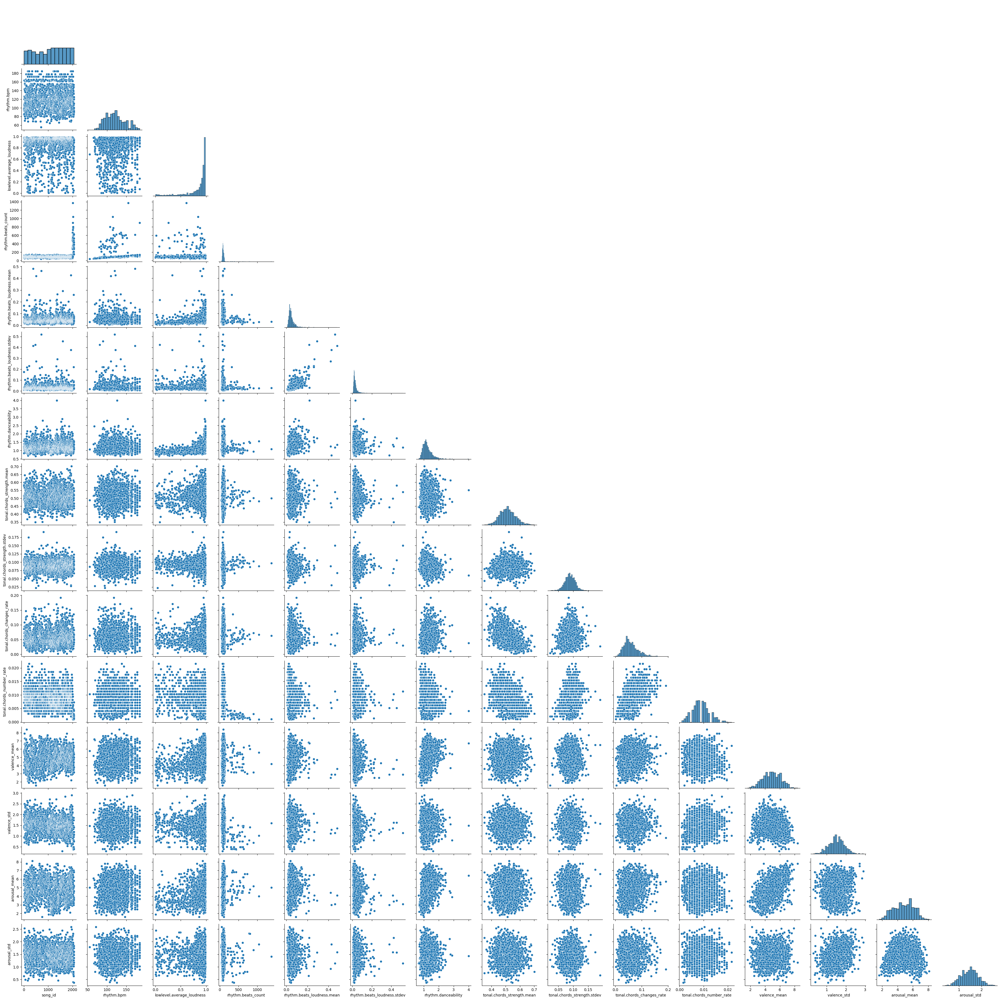

In [ ]:
sns.pairplot(df_all, corner=True)

In [ ]:
df_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1802 entries, 0 to 1801
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   song_id                      1802 non-null   int64  
 1   rhythm.bpm                   1802 non-null   float64
 2   lowlevel.average_loudness    1802 non-null   float64
 3   rhythm.beats_count           1802 non-null   float64
 4   rhythm.beats_loudness.mean   1802 non-null   float64
 5   rhythm.beats_loudness.stdev  1802 non-null   float64
 6   rhythm.danceability          1802 non-null   float64
 7   tonal.chords_key             1802 non-null   object 
 8   tonal.chords_scale           1802 non-null   object 
 9   tonal.chords_strength.mean   1802 non-null   float64
 10  tonal.chords_strength.stdev  1802 non-null   float64
 11  tonal.chords_changes_rate    1802 non-null   float64
 12  tonal.chords_number_rate     1802 non-null   float64
 13   valence_mean     

In [ ]:
tonal_chords_keys = df_all['tonal.chords_key'].unique().tolist()
tonal_chords_scales = df_all['tonal.chords_scale'].unique().tolist()

['major', 'minor']


## Boxplots

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='tonal.chords_scale', ylabel=' valence_mean'>

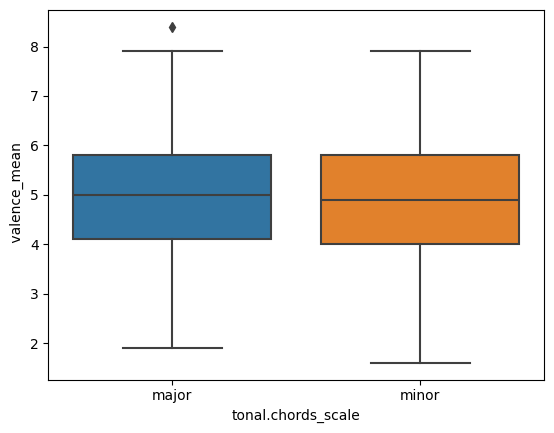

In [ ]:
sns.boxplot(data=df_all, x='tonal.chords_scale', y=' valence_mean')

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='tonal.chords_scale', ylabel=' arousal_mean'>

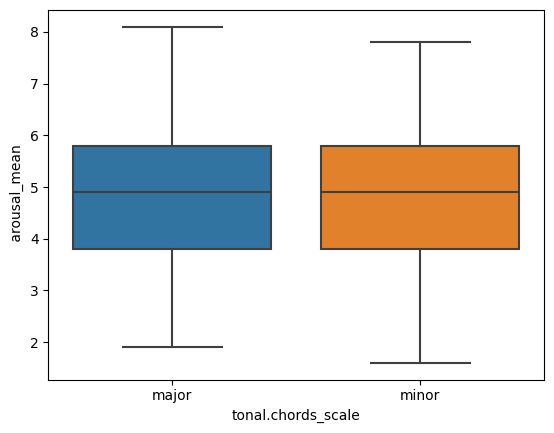

In [ ]:
sns.boxplot(data=df_all, x='tonal.chords_scale', y=' arousal_mean')

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='tonal.chords_key', ylabel=' valence_mean'>

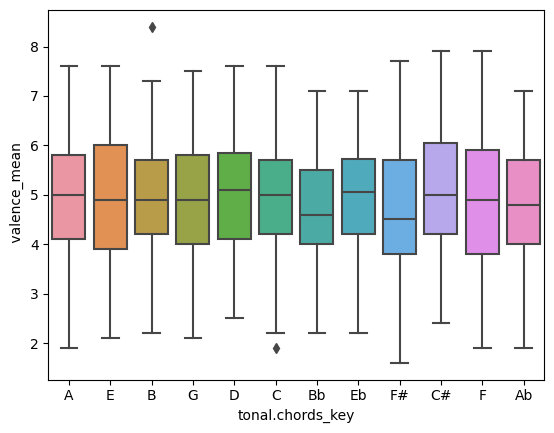

In [ ]:
sns.boxplot(data=df_all, x='tonal.chords_key', y=' valence_mean')

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='tonal.chords_key', ylabel=' arousal_mean'>

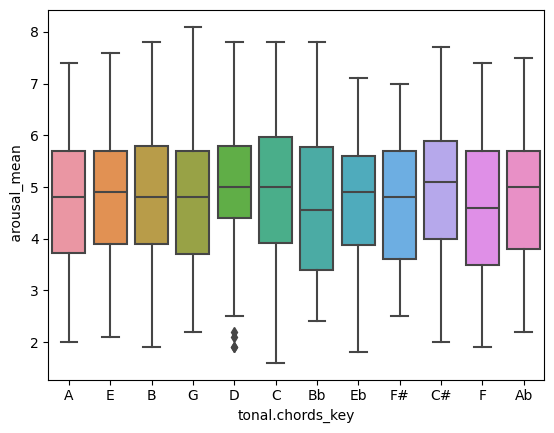

In [ ]:
sns.boxplot(data=df_all, x='tonal.chords_key', y=' arousal_mean')

## Scatter plots

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: 

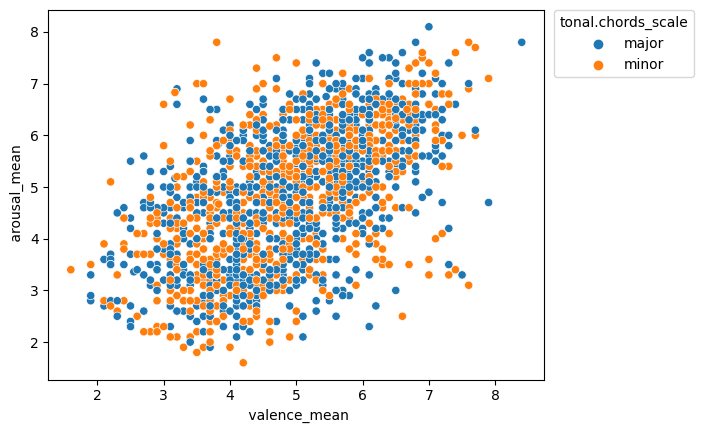

In [ ]:
sns.scatterplot(data=df_all, x=' valence_mean', y=' arousal_mean', hue='tonal.chords_scale')
plt.legend(title='tonal.chords_scale', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: 

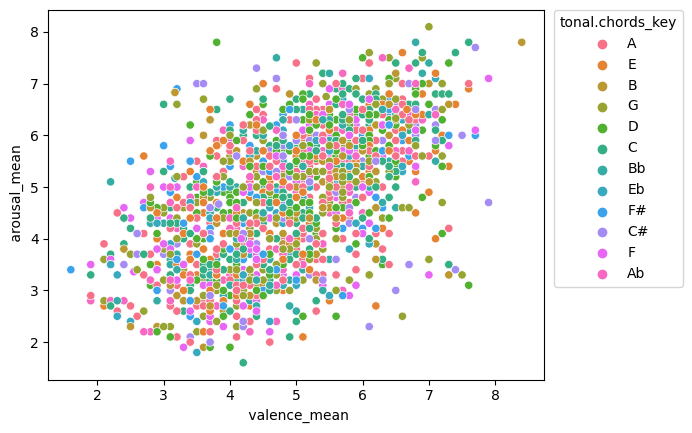

In [ ]:
sns.scatterplot(data=df_all, x=' valence_mean', y=' arousal_mean', hue='tonal.chords_key')
plt.legend(title='tonal.chords_key', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


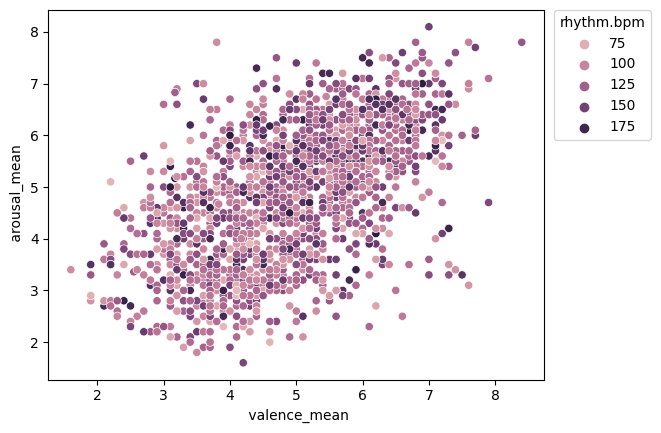

In [ ]:
sns.scatterplot(data=df_all, x=' valence_mean', y=' arousal_mean', hue='rhythm.bpm')
plt.legend(title='rhythm.bpm', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


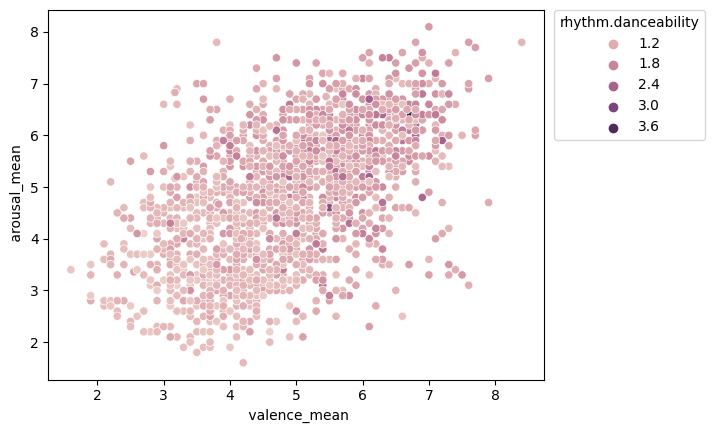

In [ ]:
sns.scatterplot(data=df_all, x=' valence_mean', y=' arousal_mean', hue='rhythm.danceability')
plt.legend(title='rhythm.danceability', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


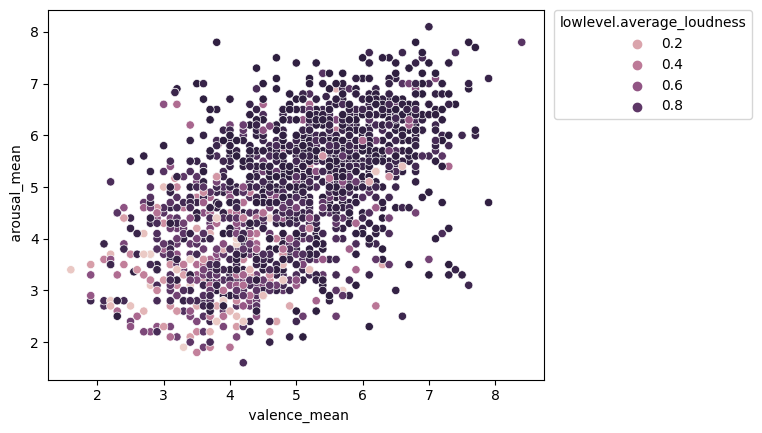

In [ ]:
sns.scatterplot(data=df_all, x=' valence_mean', y=' arousal_mean', hue='lowlevel.average_loudness')
plt.legend(title='lowlevel.average_loudness', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


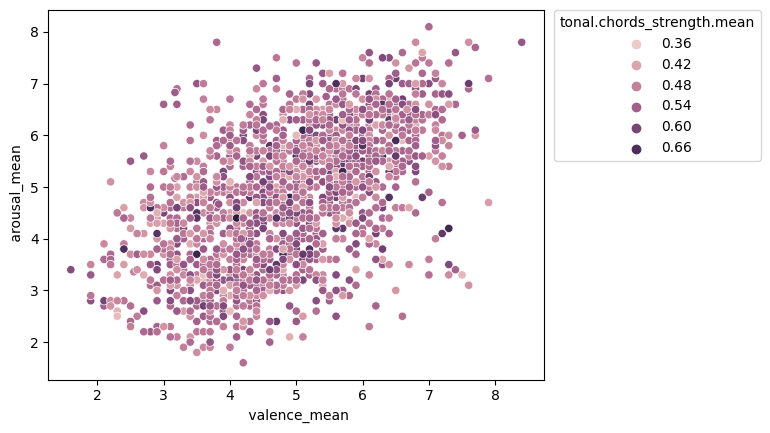

In [ ]:
sns.scatterplot(data=df_all, x=' valence_mean', y=' arousal_mean', hue='tonal.chords_strength.mean')
plt.legend(title='tonal.chords_strength.mean', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


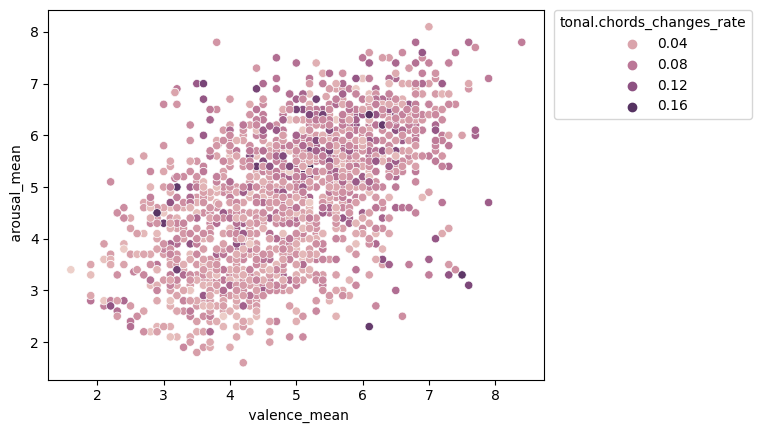

In [ ]:
sns.scatterplot(data=df_all, x=' valence_mean', y=' arousal_mean', hue='tonal.chords_changes_rate')
plt.legend(title='tonal.chords_changes_rate', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


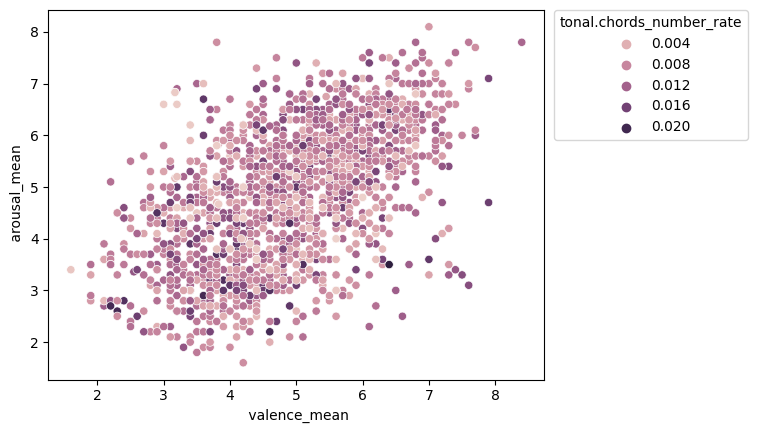

In [ ]:
sns.scatterplot(data=df_all, x=' valence_mean', y=' arousal_mean', hue='tonal.chords_number_rate')
plt.legend(title='tonal.chords_number_rate', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=75e550ed-719f-4d72-aa2b-dbe53a6ba1db' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>